# Agent Metrics Analysis

This notebook processes and visualizes agent metrics from the monitor.csv file.

In [49]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import json
import os
import numpy as np
from matplotlib import pyplot as plt 
import numpy as np
from scipy import stats as sci_stats


In [50]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

In [51]:

def transform_csv(input_file, output_file):
    # Read the CSV file
    df = pd.read_csv(input_file, comment='#', skipinitialspace=True)

    # Function to extract agent and value
    def extract_agent_value(s):
        parts = s.split('_')
        return f'pursuer_{parts[1]}', parts[2]

    # Apply the extraction to each column
    columns_to_extract = ['arousal', 'satiety', 'social-touch', 'social-touch-modulation', 'evader-eaten', 'food_indicator', 'nutrition-per-pursuer', 'poison_indicator']
    for col in columns_to_extract:
        df[f'{col}_agent'], df[f'{col}_value'] = zip(*df[col].apply(extract_agent_value))

    # Reshape the dataframe
    result = pd.DataFrame({
        'agent': df['arousal_agent'],
        'r': df['r'],
        'l': df['l'],
        't': df['t'],
        'arousal': df['arousal_value'].astype(float),
        'satiety': df['satiety_value'].astype(float),
        'social_touch': df['social-touch_value'].astype(float),
        'social_touch_modulation': df['social-touch-modulation_value'].astype(float),
        'evader_eaten': df['evader-eaten_value'].map({'False': 0, 'True': 1}).astype(int),
        'food_indicator': df['food_indicator_value'].astype(float),
        'nutrition_per_pursuer': df['nutrition-per-pursuer_value'].astype(float),
        'poison_indicator': df['poison_indicator_value'].astype(float)
    })

    # Sort the dataframe by agent and time
    result = result.sort_values(['agent', 't'])

    # Normalize arousal and satiety
    for agent in result['agent'].unique():
        mask = result['agent'] == agent
        for col in ['arousal', 'satiety']:
            result.loc[mask, f'{col}_norm'] = (result.loc[mask, col] - result.loc[mask, col].mean()) / result.loc[mask, col].std()

    # Save the result to a new CSV file
    result.to_csv(output_file, index=False)

    print(f"Transformed data saved to {output_file}")
    return result

   

In [53]:
def calculate_rolling_stats(df, window_size):
    stats = []
    df = df.rename(columns={'r': 'rewards'})

    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        rolling_data = pd.DataFrame({
            'arousal_mean': agent_data['arousal'].rolling(window=window_size).mean(),
            'arousal_std': agent_data['arousal'].rolling(window=window_size).std(),
            'satiety_mean': agent_data['satiety'].rolling(window=window_size).mean(),
            'satiety_std': agent_data['satiety'].rolling(window=window_size).std(),
            'arousal_norm_mean': agent_data['arousal_norm'].rolling(window=window_size).mean(),
            'arousal_norm_std': agent_data['arousal_norm'].rolling(window=window_size).std(),
            'satiety_norm_mean': agent_data['satiety_norm'].rolling(window=window_size).mean(),
            'satiety_norm_std': agent_data['satiety_norm'].rolling(window=window_size).std(),
            'social_touch_frequency': agent_data['social_touch'].rolling(window=window_size).apply(lambda x: (x > 0).mean()),
            'social_touch_intensity_mean': agent_data['social_touch_modulation'].rolling(window=window_size).mean(),
            'evader_eaten_frequency': agent_data['evader_eaten'].rolling(window=window_size).mean(),
            'food_indicator_frequency': agent_data['food_indicator'].rolling(window=window_size).apply(lambda x: (x > 0).mean()),
            'nutrition_per_pursuer_mean': agent_data['nutrition_per_pursuer'].rolling(window=window_size).mean(),
            'poison_indicator_frequency': agent_data['poison_indicator'].rolling(window=window_size).apply(lambda x: (x > 0).mean()),
            'rewards_mean': agent_data['rewards'].rolling(window=window_size).mean(),
            'rewards_std': agent_data['rewards'].rolling(window=window_size).std(),
            'cumulative_rewards': agent_data['rewards'].cumsum(),
            't': agent_data['t'],
        })

        # Drop rows with NaN values
        rolling_data_cleaned = rolling_data.dropna()

        # Append the cleaned data to stats
        stats.append({
            'agent': agent,
            'arousal_mean': rolling_data_cleaned['arousal_mean'],
            'arousal_std': rolling_data_cleaned['arousal_std'],
            'satiety_mean': rolling_data_cleaned['satiety_mean'],
            'satiety_std': rolling_data_cleaned['satiety_std'],
            'arousal_norm_mean': rolling_data_cleaned['arousal_norm_mean'],
            'arousal_norm_std': rolling_data_cleaned['arousal_norm_std'],
            'satiety_norm_mean': rolling_data_cleaned['satiety_norm_mean'],
            'satiety_norm_std': rolling_data_cleaned['satiety_norm_std'],
            'social_touch_frequency': rolling_data_cleaned['social_touch_frequency'],
            'social_touch_intensity_mean': rolling_data_cleaned['social_touch_intensity_mean'],
            'evader_eaten_frequency': rolling_data_cleaned['evader_eaten_frequency'],
            'food_indicator_frequency': rolling_data_cleaned['food_indicator_frequency'],
            'nutrition_per_pursuer_mean': rolling_data_cleaned['nutrition_per_pursuer_mean'],
            'poison_indicator_frequency': rolling_data_cleaned['poison_indicator_frequency'],
            'rewards_mean': rolling_data_cleaned['rewards_mean'],
            'rewards_std': rolling_data_cleaned['rewards_std'],
            'cumulative_rewards': rolling_data_cleaned['cumulative_rewards'],
            't': rolling_data_cleaned['t']
        })
    return stats

In [54]:

def plot_metrics(df, stats):
    # Create figures for raw and normalized data
    fig_raw = make_subplots(rows=5, cols=2, subplot_titles=(
        'Arousal Over Time', 'Satiety Over Time', 
        'Social Touch Frequency Over Time', 'Rewards Over Time',
        'Evader Eaten Count', 'Food Indicator Count',
        'Nutrition Per Pursuer', 'Poison Indicator Count',
        'Cumulative Rewards', ''
    ))
    fig_norm = make_subplots(rows=3, cols=1, subplot_titles=(
        'Normalized Arousal Over Time', 
        'Normalized Satiety Over Time', 
        'Social Touch Frequency Over Time'
    ))

    # Colors for each agent
    colors = {'pursuer_0': 'blue', 'pursuer_1': 'red'}

    # Plot raw and normalized data
    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        
        # Raw data
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['arousal'], mode='lines', name=f'{agent} Arousal', line=dict(color=colors[agent])), row=1, col=1)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['satiety'], mode='lines', name=f'{agent} Satiety', line=dict(color=colors[agent])), row=1, col=2)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['social_touch_frequency'], mode='lines', name=f'{agent} Social Touch Frequency', line=dict(color=colors[agent])), row=2, col=1)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['rewards'], mode='lines', name=f'{agent} Rewards', line=dict(color=colors[agent])), row=2, col=2)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['evader_eaten'], mode='lines', name=f'{agent} Evader Eaten', line=dict(color=colors[agent])), row=3, col=1)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['food_indicator'], mode='lines', name=f'{agent} Food Indicator', line=dict(color=colors[agent])), row=3, col=2)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['nutrition_per_pursuer'], mode='lines', name=f'{agent} Nutrition', line=dict(color=colors[agent])), row=4, col=1)
        fig_raw.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['poison_indicator'], mode='lines', name=f'{agent} Poison Indicator', line=dict(color=colors[agent])), row=4, col=2)

        # Normalized data
        fig_norm.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['arousal_norm'], mode='lines', name=f'{agent} Arousal', line=dict(color=colors[agent])), row=1, col=1)
        fig_norm.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['satiety_norm'], mode='lines', name=f'{agent} Satiety', line=dict(color=colors[agent])), row=2, col=1)
        fig_norm.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['social_touch_frequency'], mode='lines', name=f'{agent} Social Touch Frequency', line=dict(color=colors[agent])), row=3, col=1)

    # Add rolling mean to raw and normalized plots
    for stat in stats:
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['arousal_mean'], mode='lines', name=f"{stat['agent']} Arousal Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=1, col=1)
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['satiety_mean'], mode='lines', name=f"{stat['agent']} Satiety Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=1, col=2)
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['social_touch_frequency_mean'], mode='lines', name=f"{stat['agent']} Social Touch Freq Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=2, col=1)
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['rewards_mean'], mode='lines', name=f"{stat['agent']} Rewards Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=2, col=2)
        fig_raw.add_trace(go.Scatter(x=stat['t'], y=stat['cumulative_rewards'], mode='lines', name=f"{stat['agent']} Cumulative Rewards", line=dict(color=colors[stat['agent']])), row=5, col=1)

        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['arousal_norm_mean'], mode='lines', name=f"{stat['agent']} Arousal Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=1, col=1)
        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['satiety_norm_mean'], mode='lines', name=f"{stat['agent']} Satiety Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=2, col=1)
        fig_norm.add_trace(go.Scatter(x=stat['t'], y=stat['social_touch_frequency_mean'], mode='lines', name=f"{stat['agent']} Social Touch Freq Mean", line=dict(dash='dash', color=colors[stat['agent']])), row=3, col=1)

    # Update layout for both figures
    for fig, title in [(fig_raw, "Raw Agent Metrics Over Time"), (fig_norm, "Normalized Agent Metrics Over Time")]:
        fig.update_layout(height=1800 if title.startswith("Raw") else 900, width=1200, title_text=title)
        fig.update_xaxes(title_text="Time", row=5 if title.startswith("Raw") else 3, col=1)

    # Update y-axis titles for raw figure
    y_titles_raw = ['Arousal', 'Satiety', 'Social Touch Frequency', 'Rewards', 
                    'Evader Eaten Count', 'Food Indicator Count', 
                    'Nutrition Per Pursuer', 'Poison Indicator Count', 'Cumulative Rewards']
    for i, title in enumerate(y_titles_raw):
        fig_raw.update_yaxes(title_text=title, row=(i // 2) + 1, col=(i % 2) + 1)

    # Update y-axis titles for normalized figure
    y_titles_norm = ['Normalized Arousal', 'Normalized Satiety', 'Social Touch Frequency']
    for i, title in enumerate(y_titles_norm):
        fig_norm.update_yaxes(title_text=title, row=i+1, col=1)

    return fig_raw, fig_norm

## Set the log directory and process the data

In [55]:
# Set your log directory here
log_dir = "./logs/myriad-average_pettingzoo.sisl.waterworld_model1_20240830-113028"
#"./logs/average_pettingzoo.sisl.waterworld_model1_20240824-101114"
#"./logs/average_pettingzoo.sisl.waterworld_model1_20240819-135152"

input_file = os.path.join(log_dir, 'monitor.csv')
transformed_file = os.path.join(log_dir, 'transformed_monitor.csv')

# Check if input file exists
if not os.path.exists(input_file):
    print(f"Error: {input_file} not found.")
else:
    # Always transform the CSV to ensure we have the latest version with normalized columns
    df = transform_csv(input_file, transformed_file)

    # Calculate the window size for rolling statistics
    total_time_points = len(df['t'].unique())
    window_size = max(1, total_time_points // 100)  # Ensure at least 1

    # Calculate rolling statistics
    stats = calculate_rolling_stats(df, window_size)

    print("Data processing completed.")

Transformed data saved to ./logs/myriad-average_pettingzoo.sisl.waterworld_model1_20240830-113028/transformed_monitor.csv
Data processing completed.


In [56]:
#No touch effect

# Set your log directory here
log_dir = "./logs/myriad-no_effect_pettingzoo.sisl.waterworld_model1_20240830-113028"
#"./logs/no_effect_pettingzoo.sisl.waterworld_model1_20240820-115235"

input_file = os.path.join(log_dir, 'monitor.csv')
transformed_file = os.path.join(log_dir, 'transformed_monitor.csv')

# Check if input file exists
if not os.path.exists(input_file):
    print(f"Error: {input_file} not found.")
else:
    # Always transform the CSV to ensure we have the latest version with normalized columns
    df_no_effect = transform_csv(input_file, transformed_file)

    # Calculate the window size for rolling statistics
    total_time_points_no_effect = len(df['t'].unique())
    window_size = max(1, total_time_points_no_effect // 100)  # Ensure at least 1

    # Calculate rolling statistics
    stats_no_effect = calculate_rolling_stats(df_no_effect, window_size)

    print("Data processing completed.")

Transformed data saved to ./logs/myriad-no_effect_pettingzoo.sisl.waterworld_model1_20240830-113028/transformed_monitor.csv
Data processing completed.


'    \nstats_no_effect = calculate_rolling_stats(df_no_effect, window_size)\nfor agent_stats in stats_no_effect:\n    plot_agent_metrics(agent_stats)\n    plt.suptitle(f"Metrics for Agent: {agent_stats[\'agent\']}", fontsize=16)\n    plt.show()\n'

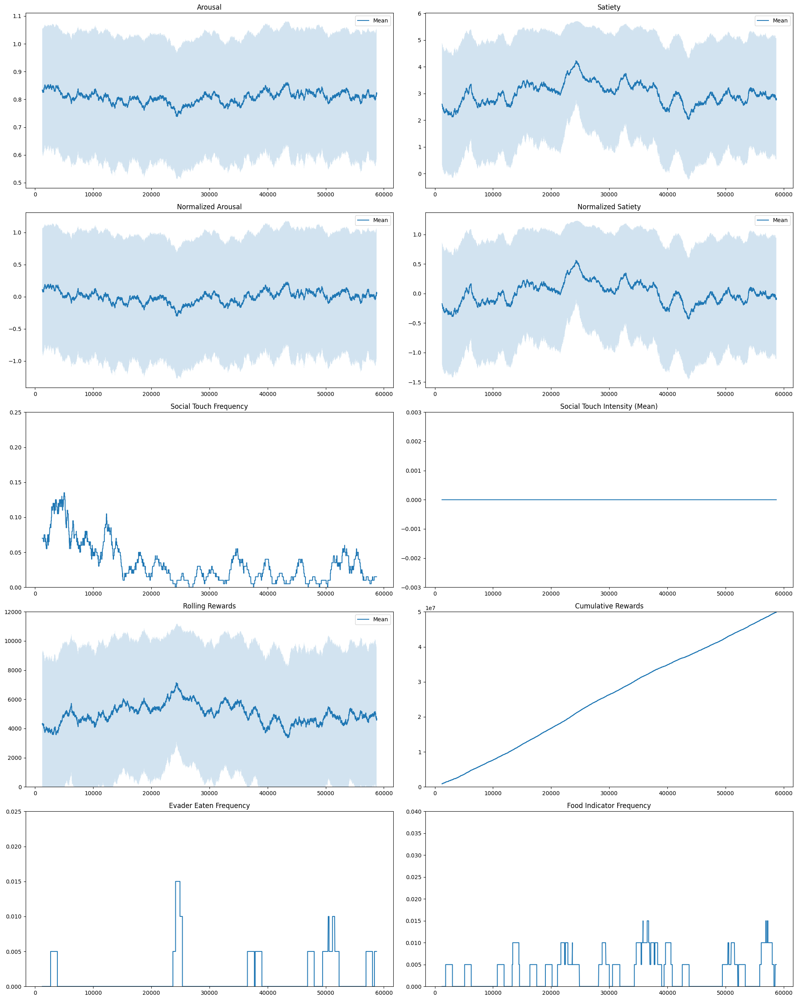

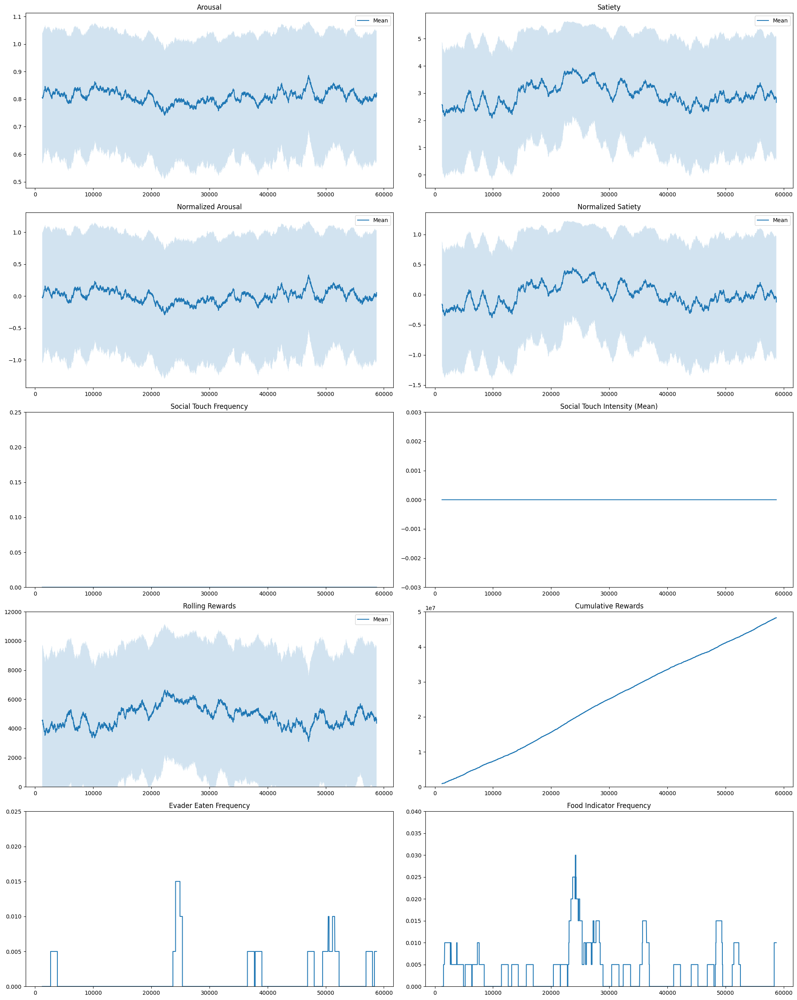

In [74]:
def plot_agent_metrics(agent_data, log_dir):
    plt.figure(figsize=(20, 25))
    
    # Plot arousal
    plt.subplot(5, 2, 1)
    plt.plot(agent_data['t'], agent_data['arousal_mean'], label='Mean')
    plt.fill_between(agent_data['t'],
                     agent_data['arousal_mean'] - agent_data['arousal_std'],
                     agent_data['arousal_mean'] + agent_data['arousal_std'],
                     alpha=0.2)
    plt.title('Arousal')
    plt.legend()
    
    # Plot satiety
    plt.subplot(5, 2, 2)
    plt.plot(agent_data['t'], agent_data['satiety_mean'], label='Mean')
    plt.fill_between(agent_data['t'],
                     agent_data['satiety_mean'] - agent_data['satiety_std'],
                     agent_data['satiety_mean'] + agent_data['satiety_std'],
                     alpha=0.2)
    plt.title('Satiety')
    plt.legend()
    
    # Plot normalized arousal
    plt.subplot(5, 2, 3)
    plt.plot(agent_data['t'], agent_data['arousal_norm_mean'], label='Mean')
    plt.fill_between(agent_data['t'],
                     agent_data['arousal_norm_mean'] - agent_data['arousal_norm_std'],
                     agent_data['arousal_norm_mean'] + agent_data['arousal_norm_std'],
                     alpha=0.2)
    plt.title('Normalized Arousal')
    plt.legend()
    
    # Plot normalized satiety
    plt.subplot(5, 2, 4)
    plt.plot(agent_data['t'], agent_data['satiety_norm_mean'], label='Mean')
    plt.fill_between(agent_data['t'],
                     agent_data['satiety_norm_mean'] - agent_data['satiety_norm_std'],
                     agent_data['satiety_norm_mean'] + agent_data['satiety_norm_std'],
                     alpha=0.2)
    plt.title('Normalized Satiety')
    plt.legend()
    
    # Plot social touch frequency
    plt.subplot(5, 2, 5)
    plt.plot(agent_data['t'], agent_data['social_touch_frequency'])
    plt.title('Social Touch Frequency')
    plt.ylim(0, 0.25)  # Set y-axis limit for social touch frequency
    
    # Plot social touch intensity mean
    plt.subplot(5, 2, 6)
    plt.plot(agent_data['t'], agent_data['social_touch_intensity_mean'])
    plt.title('Social Touch Intensity (Mean)')
    plt.ylim(-0.003, 0.003)  # Set y-axis limit for touch intensity
    
    # Plot rolling rewards
    plt.subplot(5, 2, 7)
    plt.plot(agent_data['t'], agent_data['rewards_mean'], label='Mean')
    plt.fill_between(agent_data['t'],
                     agent_data['rewards_mean'] - agent_data['rewards_std'],
                     agent_data['rewards_mean'] + agent_data['rewards_std'],
                     alpha=0.2)
    plt.title('Rolling Rewards')
    plt.legend()
    plt.ylim(0, 12000)  # Set y-axis limit for rolling rewards
    
    # Plot cumulative rewards
    plt.subplot(5, 2, 8)
    plt.plot(agent_data['t'], agent_data['cumulative_rewards'])
    plt.title('Cumulative Rewards')
    plt.ylim(0, 5e7)  # Set y-axis limit for cumulative rewards
    
    # Plot evader eaten frequency
    plt.subplot(5, 2, 9)
    plt.plot(agent_data['t'], agent_data['evader_eaten_frequency'])
    plt.title('Evader Eaten Frequency')
    plt.ylim(0, 0.025)  # Set y-axis limit for evader frequency
    
    # Plot food indicator frequency
    plt.subplot(5, 2, 10)
    plt.plot(agent_data['t'], agent_data['food_indicator_frequency'])
    plt.title('Food Indicator Frequency')
    plt.ylim(0, 0.04)  # Set y-axis limit for food indicator frequency
    
    plt.tight_layout()
    plt.savefig(f"{log_dir}/training_metrics_progression_{agent_data['agent'][0]}.png")


# Function to plot metrics for all agents
def plot_all_agent_metrics(stats, log_dir):
    for agent_data in stats:
        plot_agent_metrics(agent_data, log_dir)

plot_all_agent_metrics(stats_no_effect, log_dir)
   
'''    
stats_no_effect = calculate_rolling_stats(df_no_effect, window_size)
for agent_stats in stats_no_effect:
    plot_agent_metrics(agent_stats)
    plt.suptitle(f"Metrics for Agent: {agent_stats['agent']}", fontsize=16)
    plt.show()
'''

In [61]:
for agent_stats in stats:
    plt.suptitle(f"Metrics for Agent: {agent_stats['agent']}", fontsize=16)
    print("beginning arousal state: " + str(agent_stats['arousal_mean'].reset_index(drop=True)[0]) + " , ending arousal state: "  + str(agent_stats['arousal_mean'].reset_index(drop=True)[-1:]))
    print("beginning satiety state: " + str(agent_stats['satiety_mean'].reset_index(drop=True)[0]) + " , ending satiety state: "  + str(agent_stats['satiety_mean'].reset_index(drop=True)[-1:]))

beginning arousal state: 0.8365301838644826 , ending arousal state: 9816    0.759099
Name: arousal_mean, dtype: float64
beginning satiety state: 2.7910575886573543 , ending satiety state: 9816    3.889236
Name: satiety_mean, dtype: float64
beginning arousal state: 0.8125464799059485 , ending arousal state: 9816    0.766347
Name: arousal_mean, dtype: float64
beginning satiety state: 2.896580147269023 , ending satiety state: 9816    3.892253
Name: satiety_mean, dtype: float64


<Figure size 640x480 with 0 Axes>

## Plot the metrics

In [78]:
fig_raw, fig_norm = plot_metrics(df, stats)
fig_raw.show()

In [79]:
fig_norm.show()

## Print simple metrics

In [75]:
def calculate_average_metrics(df):
    metrics = {
        'arousal': df.groupby('t')['arousal'].mean(),
        'satiety': df.groupby('t')['satiety'].mean(),
        'arousal_norm': df.groupby('t')['arousal_norm'].mean(),
        'satiety_norm': df.groupby('t')['satiety_norm'].mean(),
        'social_touch': df.groupby('t')['social_touch'].mean(),
        'rewards': df.groupby('t')['r'].mean()
    }
    results = {
        'arousal_mean': metrics['arousal'].mean(),
        'arousal_std': metrics['arousal'].std(),
        'satiety_mean': metrics['satiety'].mean(),
        'satiety_std': metrics['satiety'].std(),
        'arousal_norm_mean': metrics['arousal_norm'].mean(),
        'arousal_norm_std': metrics['arousal_norm'].std(),
        'satiety_norm_mean': metrics['satiety_norm'].mean(),
        'satiety_norm_std': metrics['satiety_norm'].std(),
        'touch_frequency': (metrics['social_touch'] > 0).mean(),
        'rewards_mean': metrics['rewards'].mean(),
        'rewards_std': metrics['rewards'].std(),
    }
    return results

# Get the number of rows in each dataframe
num_rows_haptic = 9816
num_rows_no_haptic = 9816

print("\nAverage Metrics for system with haptic modulation:")
haptic_metrics = calculate_average_metrics(df)
print(f"Arousal - Mean: {haptic_metrics['arousal_mean']:.4f}, Std Dev: {haptic_metrics['arousal_std']:.4f}")
print(f"Satiety - Mean: {haptic_metrics['satiety_mean']:.4f}, Std Dev: {haptic_metrics['satiety_std']:.4f}")
print(f"Rewards - Mean: {haptic_metrics['rewards_mean']:.4f}, Std Dev: {haptic_metrics['rewards_std']:.4f}")
print("Cumulative Rewards at the End: " + str(stats[0]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_haptic]+stats[1]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_haptic]))
print(f"Touch Frequency: {haptic_metrics['touch_frequency']:.4f}")

print("\nAverage Metrics for system with no haptic modulation:")
no_haptic_metrics = calculate_average_metrics(df_no_effect)
print(f"Arousal - Mean: {no_haptic_metrics['arousal_mean']:.4f}, Std Dev: {no_haptic_metrics['arousal_std']:.4f}")
print(f"Satiety - Mean: {no_haptic_metrics['satiety_mean']:.4f}, Std Dev: {no_haptic_metrics['satiety_std']:.4f}")
print(f"Rewards - Mean: {no_haptic_metrics['rewards_mean']:.4f}, Std Dev: {no_haptic_metrics['rewards_std']:.4f}")
print("Cumulative Rewards at the End: " + str(stats_no_effect[0]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_no_haptic]+stats_no_effect[1]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_no_haptic]))
print(f"Touch Frequency: {no_haptic_metrics['touch_frequency']:.4f}")

# Calculate and print differences
print("\nDifferences (Haptic - No Haptic):")
print(f"Arousal Mean Difference: {haptic_metrics['arousal_mean'] - no_haptic_metrics['arousal_mean']:.4f}")
print(f"Satiety Mean Difference: {haptic_metrics['satiety_mean'] - no_haptic_metrics['satiety_mean']:.4f}")
print(f"Rewards Mean Difference: {haptic_metrics['rewards_mean'] - no_haptic_metrics['rewards_mean']:.4f}")
print(f"Cumulative Rewards Difference: " + str(stats[0]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_haptic]+stats[1]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_haptic]-stats_no_effect[0]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_no_haptic]-stats_no_effect[1]['cumulative_rewards'].reset_index(drop=True)[-1:][num_rows_no_haptic]))
print(f"Touch Frequency Difference: {haptic_metrics['touch_frequency'] - no_haptic_metrics['touch_frequency']:.4f}")




Average Metrics for system with haptic modulation:
Arousal - Mean: 0.8170, Std Dev: 0.2215
Satiety - Mean: 2.8965, Std Dev: 2.2289
Rewards - Mean: 4950.6506, Std Dev: 4943.1048
Cumulative Rewards at the End: 99171431.98282938
Touch Frequency: 0.0215

Average Metrics for system with no haptic modulation:
Arousal - Mean: 0.8087, Std Dev: 0.2316
Satiety - Mean: 2.9564, Std Dev: 2.2128
Rewards - Mean: 4904.7400, Std Dev: 4900.1978
Cumulative Rewards at the End: 98251752.28996715
Touch Frequency: 0.0169

Differences (Haptic - No Haptic):
Arousal Mean Difference: 0.0083
Satiety Mean Difference: -0.0598
Rewards Mean Difference: 45.9105
Cumulative Rewards Difference: 919679.6928622276
Touch Frequency Difference: 0.0046


In [76]:
print("\nComparison of metrics before and after for system with haptic modulation")
print("")
print("arousal at first time window: " + str((stats[0]['arousal_mean'].reset_index(drop=True)[0]+stats[1]['arousal_mean'].reset_index(drop=True)[0])/2))
print("arousal at last time window: " + str(((stats[0]['arousal_mean'].reset_index(drop=True)[-1:]+stats[1]['arousal_mean'].reset_index(drop=True)[-1:])/2)[9816]))
print("")
print("satiety at first time window: " + str((stats[0]['satiety_mean'].reset_index(drop=True)[0]+stats[1]['satiety_mean'].reset_index(drop=True)[0])/2))
print("satiety at last time window: " + str(((stats[0]['satiety_mean'].reset_index(drop=True)[-1:]+stats[1]['satiety_mean'].reset_index(drop=True)[-1:])/2)[9816]))
print("")
print("rewards at first time window: " + str((stats[0]['rewards_mean'].reset_index(drop=True)[0]+stats[1]['rewards_mean'].reset_index(drop=True)[0])/2))
print("rewards at last time window: " + str(((stats[0]['rewards_mean'].reset_index(drop=True)[-1:]+stats[1]['rewards_mean'].reset_index(drop=True)[-1:])/2)[9816]))
print("")


print("\nComparison of metrics before and after for system with no haptic modulation")
print("")
print("arousal at first time window: " + str((stats_no_effect[0]['arousal_mean'].reset_index(drop=True)[0]+stats_no_effect[1]['arousal_mean'].reset_index(drop=True)[0])/2))
print("arousal at last time window: " + str(((stats_no_effect[0]['arousal_mean'].reset_index(drop=True)[-1:]+stats_no_effect[1]['arousal_mean'].reset_index(drop=True)[-1:])/2)[9816]))
print("")
print("satiety at first time window: " + str((stats_no_effect[0]['satiety_mean'].reset_index(drop=True)[0]+stats_no_effect[1]['satiety_mean'].reset_index(drop=True)[0])/2))
print("satiety at last time window: " + str(((stats_no_effect[0]['satiety_mean'].reset_index(drop=True)[-1:]+stats_no_effect[1]['satiety_mean'].reset_index(drop=True)[-1:])/2)[9816]))
print("")
print("rewards at first time window: " + str((stats_no_effect[0]['rewards_mean'].reset_index(drop=True)[0]+stats_no_effect[1]['rewards_mean'].reset_index(drop=True)[0])/2))
print("rewards at last time window: " + str(((stats_no_effect[0]['rewards_mean'].reset_index(drop=True)[-1:]+stats_no_effect[1]['rewards_mean'].reset_index(drop=True)[-1:])/2)[9816]))


Comparison of metrics before and after for system with haptic modulation

arousal at first time window: 0.8245383318852155
arousal at last time window: 0.7627230335707234

satiety at first time window: 2.8438188679631886
satiety at last time window: 3.8907448128031694

rewards at first time window: 4589.8580261625
rewards at last time window: 6739.45719478


Comparison of metrics before and after for system with no haptic modulation

arousal at first time window: 0.8194273980360873
arousal at last time window: 0.8232652147911761

satiety at first time window: 2.5878386462374623
satiety at last time window: 2.7070750961297594

rewards at first time window: 4436.941536585
rewards at last time window: 4467.1544166125


In [78]:
print("Evader eating behaviour metric")
print("With haptic modulation: " + str(stats[0]['evader_eaten_frequency'].mean()))
print("With no haptic modulation: " + str(stats_no_effect[0]['evader_eaten_frequency'].mean()))
print("")
print("Poison touch behaviour metric")
print("With haptic modulation: " + str(stats[0]['poison_indicator_frequency'].mean()))
print("With no haptic modulation: " + str(stats_no_effect[0]['poison_indicator_frequency'].mean()))

Evader eating behaviour metric
With haptic modulation: 0.0005093205663644698
With no haptic modulation: 0.0011581949679128044

Poison touch behaviour metric
With haptic modulation: 0.0023240297443210753
With no haptic modulation: 0.002750331058368137


CHECK IF BETWEEN THE TWO, IF THERE IS SIGNIFICANT DIFFERENCE 


In [79]:


def compare_time_series(series1, series2, metric_name):
    print(f"Comparing {metric_name}:")
    
    # 1. Augmented Dickey-Fuller test for stationarity
    result1 = adfuller(series1)
    result2 = adfuller(series2)
    print(f"ADF Statistic for series 1: {result1[0]}, p-value: {result1[1]}")
    print(f"ADF Statistic for series 2: {result2[0]}, p-value: {result2[1]}")
    
    # 2. Kolmogorov-Smirnov test
    ks_statistic, p_value = sci_stats.ks_2samp(series1, series2)
    print(f"Kolmogorov-Smirnov test: statistic = {ks_statistic}, p-value = {p_value}")
    
    # 3. Mann-Whitney U test
    statistic, p_value = sci_stats.mannwhitneyu(series1, series2)
    print(f"Mann-Whitney U test: statistic = {statistic}, p-value = {p_value}")
    
    # 4. ARIMA model comparison (example with order (1,0,0))
    model1 = ARIMA(series1, order=(1,0,0))
    model2 = ARIMA(series2, order=(1,0,0))
    results1 = model1.fit()
    results2 = model2.fit()
    print(f"ARIMA AIC for series 1: {results1.aic}")
    print(f"ARIMA AIC for series 2: {results2.aic}")
    
    print("\n")

for agent in df['agent'].unique():
    agent_data_no_effect = df_no_effect[df_no_effect['agent'] == agent]
    agent_data = df[df['agent'] == agent]
    compare_time_series(agent_data_no_effect['arousal'].reset_index(drop=True), agent_data['arousal'].reset_index(drop=True), f"{agent} Arousal")
    compare_time_series(agent_data_no_effect['satiety'].reset_index(drop=True), agent_data['satiety'].reset_index(drop=True), f"{agent} Satiety")

print("Sanity check to between agents within condition")
print("Haptic arousal modulation")
compare_time_series(df[df['agent'] == "pursuer_0"]['arousal'].reset_index(drop=True), df[df['agent'] == "pursuer_1"]['arousal'].reset_index(drop=True), f"{agent} Arousal")
compare_time_series(df[df['agent'] == "pursuer_0"]['satiety'].reset_index(drop=True), df[df['agent'] == "pursuer_1"]['satiety'].reset_index(drop=True), f"{agent} Satiety")
print("No haptic arousal modulation")
compare_time_series(df_no_effect[df_no_effect['agent'] == "pursuer_0"]['arousal'].reset_index(drop=True), df_no_effect[df_no_effect['agent'] == "pursuer_1"]['arousal'].reset_index(drop=True), f"{agent} Arousal")
compare_time_series(df_no_effect[df_no_effect['agent'] == "pursuer_0"]['satiety'].reset_index(drop=True), df_no_effect[df_no_effect['agent'] == "pursuer_1"]['satiety'].reset_index(drop=True), f"{agent} Satiety")



Comparing pursuer_0 Arousal:
ADF Statistic for series 1: -102.12616675601787, p-value: 0.0
ADF Statistic for series 2: -11.530115735686577, p-value: 3.8501444573015794e-21
Kolmogorov-Smirnov test: statistic = 0.08037140575079874, p-value = 1.3806374390032176e-28
Mann-Whitney U test: statistic = 49894382.5, p-value = 0.5054196411620879
ARIMA AIC for series 1: -897.8869922016064
ARIMA AIC for series 2: -3292.838270782507


Comparing pursuer_0 Satiety:
ADF Statistic for series 1: -10.171682817454775, p-value: 7.062610782947009e-18
ADF Statistic for series 2: -6.4646608811459485, p-value: 1.4150313340392903e-08
Kolmogorov-Smirnov test: statistic = 0.12280351437699677, p-value = 2.8000129452556444e-66
Mann-Whitney U test: statistic = 51855660.5, p-value = 2.266548683532831e-05
ARIMA AIC for series 1: 44292.328727329186
ARIMA AIC for series 2: 44271.3923514621


Comparing pursuer_1 Arousal:
ADF Statistic for series 1: -99.83450880882712, p-value: 0.0
ADF Statistic for series 2: -13.352991120

Compare between rolling stats, is there more stability in satiety and arousal at the end of the training compared to beginning, between conditions

Stability Comparison:
Haptic Modulation Model:
  arousal_start_mean: 0.8231
  arousal_start_std: 0.2209
  arousal_end_mean: 0.7646
  arousal_end_std: 0.2196
  satiety_start_mean: 2.8249
  satiety_start_std: 2.2641
  satiety_end_mean: 3.8915
  satiety_end_std: 1.7325

No Haptic Modulation Model:
  arousal_start_mean: 0.8186
  arousal_start_std: 0.2295
  arousal_end_mean: 0.8202
  arousal_end_std: 0.2365
  satiety_start_mean: 2.5743
  satiety_start_std: 2.2944
  satiety_end_mean: 2.7347
  satiety_end_std: 2.2768

Difference in Stability Metrics (Haptic - No Haptic):
  arousal_start_mean: 0.0045
  arousal_start_std: -0.0086
  arousal_end_mean: -0.0556
  arousal_end_std: -0.0168
  satiety_start_mean: 0.2506
  satiety_start_std: -0.0304
  satiety_end_mean: 1.1568
  satiety_end_std: -0.5442


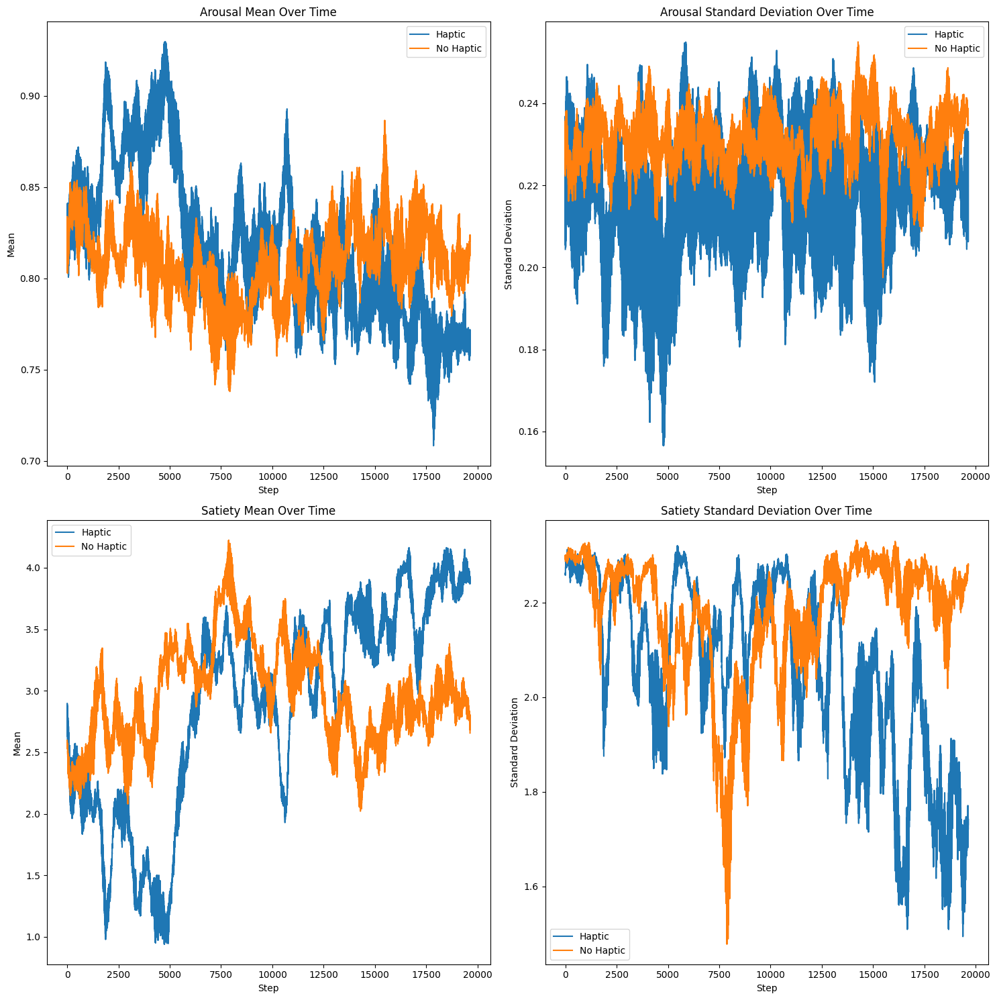

In [80]:

def compare_stability_and_efficiency(stats_haptic, stats_no_haptic, window_size=10):
    """
    Compare stability and efficiency between two models using arousal and satiety data.
    
    :param stats_haptic: List of dictionaries with stats for the haptic model
    :param stats_no_haptic: List of dictionaries with stats for the no-haptic model
    :param window_size: Size of the window for start and end comparison
    """
    
    def process_stats(stats):
        # Combine all agents' data
        combined_stats = pd.DataFrame()
        for agent_stats in stats:
            agent_df = pd.DataFrame(agent_stats)
            combined_stats = pd.concat([combined_stats, agent_df])
        
        # Sort by the original order (assuming it's already time-ordered) and reset index
        combined_stats = combined_stats.sort_index().reset_index(drop=True)
        
        # Calculate start and end windows
        start_window = combined_stats.head(window_size)
        end_window = combined_stats.tail(window_size)
        
        # Calculate stability metrics
        stability = {
            'arousal_start_mean': start_window['arousal_mean'].mean(),
            'arousal_start_std': start_window['arousal_std'].mean(),
            'arousal_end_mean': end_window['arousal_mean'].mean(),
            'arousal_end_std': end_window['arousal_std'].mean(),
            'satiety_start_mean': start_window['satiety_mean'].mean(),
            'satiety_start_std': start_window['satiety_std'].mean(),
            'satiety_end_mean': end_window['satiety_mean'].mean(),
            'satiety_end_std': end_window['satiety_std'].mean(),
        }
        
        return combined_stats, stability
    
    stats_haptic_combined, stability_haptic = process_stats(stats_haptic)
    stats_no_haptic_combined, stability_no_haptic = process_stats(stats_no_haptic)
    
    # Print stability comparison
    print("Stability Comparison:")
    print("Haptic Modulation Model:")
    for key, value in stability_haptic.items():
        print(f"  {key}: {value:.4f}")
    print("\nNo Haptic Modulation Model:")
    for key, value in stability_no_haptic.items():
        print(f"  {key}: {value:.4f}")
    
    # Plot mean and std over time
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))
    metrics = ['arousal', 'satiety']
    
    for i, metric in enumerate(metrics):
        # Plot mean
        axs[i, 0].plot(stats_haptic_combined.index, stats_haptic_combined[f'{metric}_mean'], label='Haptic')
        axs[i, 0].plot(stats_no_haptic_combined.index, stats_no_haptic_combined[f'{metric}_mean'], label='No Haptic')
        axs[i, 0].set_title(f'{metric.capitalize()} Mean Over Time')
        axs[i, 0].set_xlabel('Step')
        axs[i, 0].set_ylabel('Mean')
        axs[i, 0].legend()
        
        # Plot std
        axs[i, 1].plot(stats_haptic_combined.index, stats_haptic_combined[f'{metric}_std'], label='Haptic')
        axs[i, 1].plot(stats_no_haptic_combined.index, stats_no_haptic_combined[f'{metric}_std'], label='No Haptic')
        axs[i, 1].set_title(f'{metric.capitalize()} Standard Deviation Over Time')
        axs[i, 1].set_xlabel('Step')
        axs[i, 1].set_ylabel('Standard Deviation')
        axs[i, 1].legend()
    
    plt.tight_layout()
    plt.savefig('stability_efficiency_comparison.png')


    # Additional analysis: Compute and print the difference in stability metrics
    print("\nDifference in Stability Metrics (Haptic - No Haptic):")
    for key in stability_haptic.keys():
        diff = stability_haptic[key] - stability_no_haptic[key]
        print(f"  {key}: {diff:.4f}")

compare_stability_and_efficiency(stats, stats_no_effect)

Explore touch events: how does the frequency changed over time, and do more touch events correlate with higher reward progression 

TtestResult(statistic=-15.592308346790054, pvalue=1.7173019281534174e-54, df=20030.0)
Plot saved to ./cumulative_rewards_comparison.png
p-value of difference: 0.0000


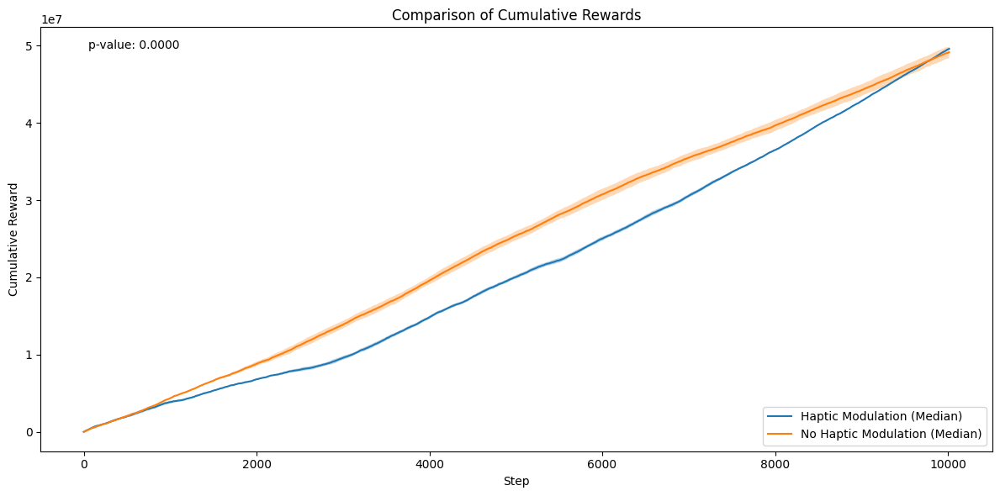

In [82]:

def compare_cumulative_rewards(df1, df2, model1_name, model2_name, output_path):
    """
    Compare cumulative rewards between two models.
    
    :param df1: DataFrame for model 1
    :param df2: DataFrame for model 2
    :param model1_name: Name of model 1 for the legend
    :param model2_name: Name of model 2 for the legend
    :param output_path: Path to save the output plot
    """
    
    def process_dataframe(df):
        # Sort the dataframe by agent and time
        df_sorted = df.sort_values(['agent', 't'])
        
        # Calculate cumulative sum of rewards for each agent
        df_sorted['cumulative_reward'] = df_sorted.groupby('agent')['r'].cumsum()
        
        # Create a step column (index within each agent group)
        df_sorted['step'] = df_sorted.groupby('agent').cumcount()
        
        # Calculate statistics across agents for each step
        stats = df_sorted.groupby('step').agg({
            'cumulative_reward': [
                ('median', 'median'),
                ('ci_lower', lambda x: np.percentile(x, 2.5)),
                ('ci_upper', lambda x: np.percentile(x, 97.5))
            ]
        })
        
        stats.columns = stats.columns.droplevel()  # Flatten multi-index columns
        return stats
    
    stats1 = process_dataframe(df1)
    stats2 = process_dataframe(df2)
    
    # Plotting
    plt.figure(figsize=(12, 6))
    
    plt.plot(stats1.index, stats1['median'], label=f'{model1_name} (Median)')
    plt.fill_between(stats1.index, stats1['ci_lower'], stats1['ci_upper'], alpha=0.3)
    
    plt.plot(stats2.index, stats2['median'], label=f'{model2_name} (Median)')
    plt.fill_between(stats2.index, stats2['ci_lower'], stats2['ci_upper'], alpha=0.3)
    
    plt.title('Comparison of Cumulative Rewards')
    plt.xlabel('Step')
    plt.ylabel('Cumulative Reward')
    plt.legend()
    
    # Perform statistical test
    min_length = min(len(stats1), len(stats2))
    _, p_value = sci_stats.ttest_ind(stats1['median'][:min_length], stats2['median'][:min_length])
    print(sci_stats.ttest_ind(stats1['median'][:min_length], stats2['median'][:min_length]))
    plt.text(0.05, 0.95, f'p-value: {p_value:.4f}', transform=plt.gca().transAxes)
    
    plt.tight_layout()
    plt.savefig(output_path)

    
    print(f"Plot saved to {output_path}")
    print(f"p-value of difference: {p_value:.4f}")

# Example usage:
compare_cumulative_rewards(df, df_no_effect, 'Haptic Modulation', 'No Haptic Modulation', './cumulative_rewards_comparison.png')

In [95]:
fig_raw_no_effect, fig_norm_no_effect = plot_metrics(df_no_effect, stats)
fig_raw_no_effect.show()
fig_norm_no_effect.show()

REWARDS ANALYSIS



In [91]:
def analyze_rewards(df, window_size):
    df = df.rename(columns={'r': 'rewards'})
    fig = make_subplots(rows=2, cols=1, subplot_titles=('Rewards Over Time', 'Cumulative Rewards Over Time'))
    colors = {'pursuer_0': 'blue', 'pursuer_1': 'red'}
    
    reward_stats = {}
    
    for agent in df['agent'].unique():
        agent_data = df[df['agent'] == agent]
        
        # Plot raw rewards
        fig.add_trace(go.Scatter(x=agent_data['t'], y=agent_data['rewards'], mode='lines', name=f'{agent} Reward', line=dict(color=colors[agent])), row=1, col=1)
        
        # Calculate and plot cumulative rewards
        cumulative_rewards = agent_data['rewards'].cumsum()
        fig.add_trace(go.Scatter(x=agent_data['t'], y=cumulative_rewards, mode='lines', name=f'{agent} Cumulative Reward', line=dict(color=colors[agent])), row=2, col=1)
        
        # Calculate rolling statistics
        reward_mean = agent_data['rewards'].rolling(window=window_size).mean()
        reward_std = agent_data['rewards'].rolling(window=window_size).std()
        reward_min = agent_data['rewards'].rolling(window=window_size).min()
        reward_max = agent_data['rewards'].rolling(window=window_size).max()
        
        # Plot rolling mean
        fig.add_trace(go.Scatter(x=agent_data['t'], y=reward_mean, mode='lines', name=f'{agent} Reward Mean', line=dict(dash='dash', color=colors[agent])), row=1, col=1)
        
        # Store statistics
        reward_stats[agent] = {
            'mean': agent_data['rewards'].mean(),
            'std': agent_data['rewards'].std(),
            'min': agent_data['rewards'].min(),
            'max': agent_data['rewards'].max(),
            'total': agent_data['rewards'].sum(),
            'rolling_mean': reward_mean,
            'rolling_std': reward_std,
            'rolling_min': reward_min,
            'rolling_max': reward_max
        }
    
    fig.update_layout(height=800, width=1000, title_text="Reward Analysis")
    fig.update_xaxes(title_text="Time", row=2, col=1)
    fig.update_yaxes(title_text="Reward", row=1, col=1)
    fig.update_yaxes(title_text="Cumulative Reward", row=2, col=1)
    
    return fig, reward_stats

In [93]:
fig_rewards_no_effect, reward_stats_no_effect = analyze_rewards(df_no_effect, window_size)
fig_rewards_no_effect.write_html(os.path.join(log_dir, 'reward_analysis_plot.html'))


In [94]:
fig_rewards_no_effect

ANALYSING TOUCH WITH ROLLING REWARDS

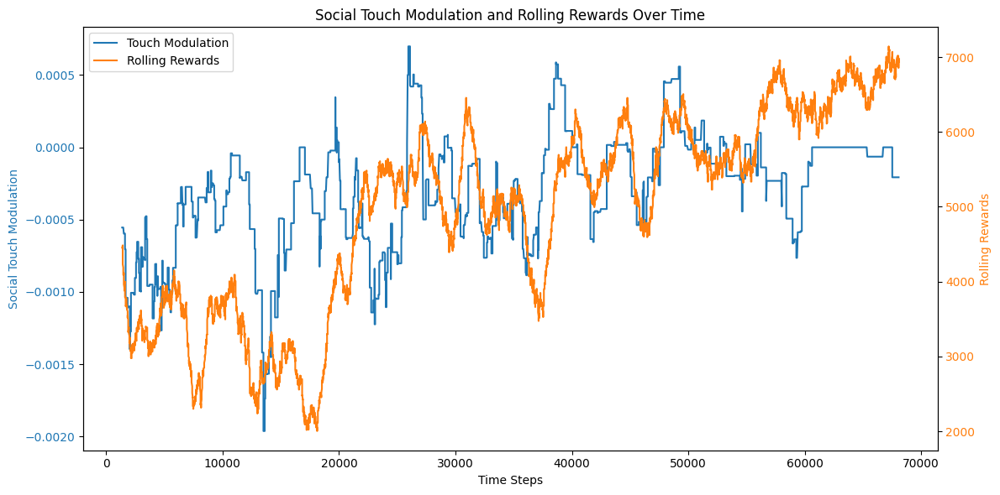

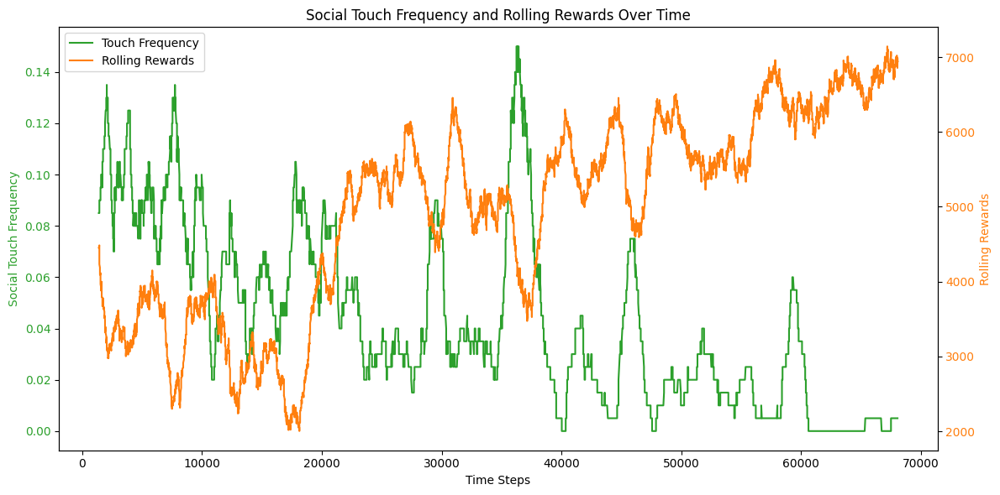

In [83]:
def plot_modulation_and_rewards(stats):
    plt.figure(figsize=(12, 6))
    
    # Primary y-axis for social touch modulation
    ax1 = plt.gca()
    ax1.set_xlabel('Time Steps')
    ax1.set_ylabel('Social Touch Modulation', color='tab:blue')
    ax1.plot(stats['t'], stats['social_touch_intensity_mean'], color='tab:blue', label='Touch Modulation')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    
    # Secondary y-axis for rolling rewards
    ax2 = ax1.twinx()
    ax2.set_ylabel('Rolling Rewards', color='tab:orange')
    ax2.plot(stats['t'], stats['rewards_mean'], color='tab:orange', label='Rolling Rewards')
    ax2.tick_params(axis='y', labelcolor='tab:orange')
    
    # Title and legend
    plt.title('Social Touch Modulation and Rolling Rewards Over Time')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    plt.tight_layout()
    plt.show()

def plot_frequency_and_rewards(stats):
    plt.figure(figsize=(12, 6))
    
    # Primary y-axis for social touch frequency
    ax1 = plt.gca()
    ax1.set_xlabel('Time Steps')
    ax1.set_ylabel('Social Touch Frequency', color='tab:green')
    ax1.plot(stats['t'], stats['social_touch_frequency'], color='tab:green', label='Touch Frequency')
    ax1.tick_params(axis='y', labelcolor='tab:green')
    
    # Secondary y-axis for rolling rewards
    ax2 = ax1.twinx()
    ax2.set_ylabel('Rolling Rewards', color='tab:orange')
    ax2.plot(stats['t'], stats['rewards_mean'], color='tab:orange', label='Rolling Rewards')
    ax2.tick_params(axis='y', labelcolor='tab:orange')
    
    # Title and legend
    plt.title('Social Touch Frequency and Rolling Rewards Over Time')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Assuming 'stats' is your rolling_stats dictionary for a single agent
plot_modulation_and_rewards(stats[0])
plot_frequency_and_rewards(stats[0])

